In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json

import sys
sys.path.append('../')

import utils
from utils import ax_rocs, plot_rocs, rocs_models
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "/mnt/c/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
# NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov1_allmodels.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Data columns (total 98 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PatientID              16077 non-null  int64  
 1   StudyDate              16077 non-null  int64  
 2   SeriesInstanceUID      16077 non-null  object 
 3   CoordX                 16077 non-null  float64
 4   CoordY                 16077 non-null  float64
 5   CoordZ                 16077 non-null  float64
 6   LesionID               16077 non-null  int64  
 7   NoduleType             16077 non-null  object 
 8   Spiculation            16077 non-null  bool   
 9   Diameter [mm]          16077 non-null  float64
 10  Age                    16077 non-null  int64  
 11  Gender                 16077 non-null  int64  
 12  FamilyHistoryLungCa    16077 non-null  bool   
 13  Emphysema              16077 non-null  bool   
 14  NoduleInUpperLung      16077 non-null  bool   
 15  No

In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v1_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    "de Haas Combined": "Thijmen_mean",
    # "de Haas Local": "Thijmen_local",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    "de Haas Global (shown nodule)": "Thijmen_global_show",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

### Convert to scan-level

In [5]:
nlst_preds_nodule.nunique()[0:30]

PatientID               5282
StudyDate                  3
SeriesInstanceUID      10183
CoordX                 11867
CoordY                 13071
CoordZ                 13528
LesionID                  18
NoduleType                 7
Spiculation                2
Diameter [mm]            368
Age                       23
Gender                     2
FamilyHistoryLungCa        2
Emphysema                  2
NoduleInUpperLung          2
NoduleCounts              12
SCT_EPI_LOC                7
xie_gc_gclobe150           6
loclup                     2
locrup                     2
PanCan2b               14187
label                      2
DL                     16068
NoduleID               10024
AnnotationID           16077
Thijmen_mean            3240
height                    28
weight                   216
pkyr                     284
smokeage                  33
dtype: int64

In [6]:
nodule_specific_cols = ['NoduleType', 'Spiculation', 'CoordX', 'CoordY', 'CoordZ', 'Diameter [mm]', 'NoduleID', 'AnnotationID']
nlst_preds = nlst_preds_nodule.drop(nodule_specific_cols, axis=1)
nlst_preds.nunique()[0:30]

PatientID               5282
StudyDate                  3
SeriesInstanceUID      10183
LesionID                  18
Age                       23
Gender                     2
FamilyHistoryLungCa        2
Emphysema                  2
NoduleInUpperLung          2
NoduleCounts              12
SCT_EPI_LOC                7
xie_gc_gclobe150           6
loclup                     2
locrup                     2
PanCan2b               14187
label                      2
DL                     16068
Thijmen_mean            3240
height                    28
weight                   216
pkyr                     284
smokeage                  33
smokeday                  42
smokeyr                   52
marital                    5
educat                     7
race                       6
ethnic                     2
cigar                      2
cigsmok                    2
dtype: int64

In [7]:
models = list(MODEL_TO_COL.values())
models.append('label')
for m in models:
    nlst_preds[m] = nlst_preds.groupby('SeriesInstanceUID')[m].transform(max)

nlst_preds.nunique().sort_values(ascending=False)

Thijmen_local            16073
SeriesInstanceUID        10183
Thijmen_global_hidden    10183
Thijmen_global_show      10182
DL                       10181
                         ...  
wrkfire                      2
wrkfarm                      2
wrkcott                      2
wrksand                      2
cancpanc                     1
Length: 90, dtype: int64

In [11]:
nlst_preds = nlst_preds.drop_duplicates(['SeriesInstanceUID'], ignore_index=True)
nlst_preds = nlst_preds[(~nlst_preds['Thijmen_mean'].isna()) & (nlst_preds['InSybilTrain'] == False)]
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1172 entries, 0 to 2050
Data columns (total 90 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PatientID              1172 non-null   int64  
 1   StudyDate              1172 non-null   int64  
 2   SeriesInstanceUID      1172 non-null   object 
 3   LesionID               1172 non-null   int64  
 4   Age                    1172 non-null   int64  
 5   Gender                 1172 non-null   int64  
 6   FamilyHistoryLungCa    1172 non-null   bool   
 7   Emphysema              1172 non-null   bool   
 8   NoduleInUpperLung      1172 non-null   bool   
 9   NoduleCounts           1172 non-null   int64  
 10  SCT_EPI_LOC            1119 non-null   float64
 11  xie_gc_gclobe150       53 non-null     float64
 12  loclup                 127 non-null    float64
 13  locrup                 127 non-null    float64
 14  PanCan2b               1172 non-null   float64
 15  label    

In [12]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    "de Haas Combined": "Thijmen_mean",
    # "de Haas Local": "Thijmen_local",
    # "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    "de Haas Global (shown nodule)": "Thijmen_global_show",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

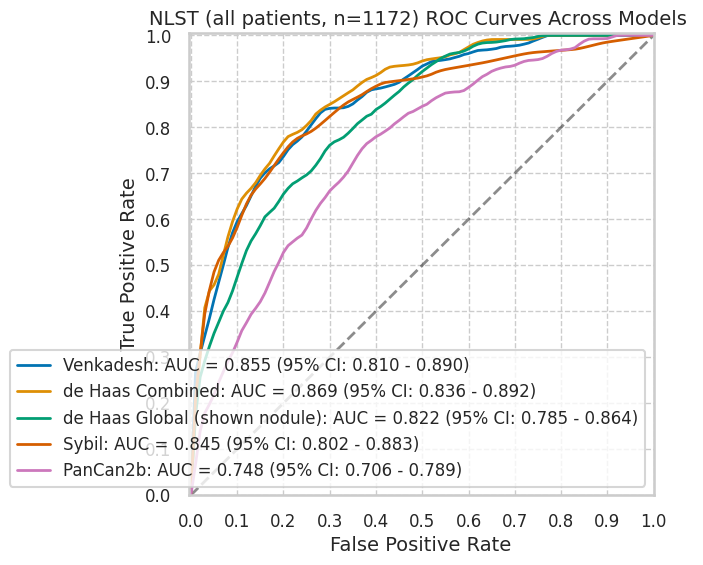

In [13]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

## Plot results by category

In [17]:
def plot_by_category(df, cat, models=MODEL_TO_COL.keys()):
    groups = df.groupby(cat) 
    df_catinfo, plot_roc = utils.info_by_splits(groups)
    display(df_catinfo)

    if (plot_roc == False) or (min(df_catinfo['num_mal']) < 5):
        print("Not plotting ROC since there are zero values for malignant or benign nodules :(")
        return df_catinfo

    rocs = {}
    for m in models:
        rocs[m], df_perf = utils.perf_by_splits(groups, pred_col=MODEL_TO_COL[m])
        print(m)
        display(df_perf)

    fig, ax = plt.subplots(1, len(models), figsize=(6.5*len(models) - 0.5, 6))
    fig.suptitle(f"Model Performance Split By {cat}")
    for i, m in enumerate(models):
        utils.ax_rocs(ax[i], rocs[m], title=m)
    plt.show()

    return df_catinfo        

### Included columns (from predictions)

In [18]:
# pred_only_cols = ["NoduleInUpperLung", "Spiculation", "NoduleType"]
# for c in pred_only_cols:
#     print(c)
#     plot_by_category(nlst_preds, c)

### Demographics

marital


,num,pct,num_mal,pct_mal
1.0,46,3.924915,0,0.000000
2.0,785,66.979522,86,10.955414
3.0,120,10.238908,14,11.666667
4.0,19,1.621160,5,26.315789
5.0,202,17.235495,22,10.891089


Not plotting ROC since there are zero values for malignant or benign nodules :(
educat


,num,pct,num_mal,pct_mal
1.0,27,2.341717,4,14.814815
2.0,67,5.810928,2,2.985075
3.0,307,26.626193,36,11.726384
4.0,144,12.489159,16,11.111111
5.0,244,21.162186,31,12.704918
6.0,185,16.045100,21,11.351351
7.0,179,15.524718,16,8.938547


Not plotting ROC since there are zero values for malignant or benign nodules :(
race


,num,pct,num_mal,pct_mal
1.0,1098,93.926433,112,10.200364
2.0,40,3.421728,9,22.500000
3.0,7,0.598802,0,0.000000
4.0,10,0.855432,5,50.000000
5.0,3,0.256630,1,33.333333
6.0,11,0.940975,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
ethnic


,num,pct,num_mal,pct_mal
1.0,11,0.940171,1,9.090909
2.0,1159,99.059829,126,10.871441


Not plotting ROC since there are zero values for malignant or benign nodules :(
Gender


,num,pct,num_mal,pct_mal
1,693,59.129693,79,11.399711
2,479,40.870307,48,10.020877


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,693,75,284,330,4,0.949367,0.462541,0.050633,0.537459,0.208914,0.988024,0.791086,0.011976,0.584416
2,479,42,206,225,6,0.875000,0.477958,0.125000,0.522042,0.169355,0.974026,0.830645,0.025974,0.557411


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,693,77,319,295,2,0.974684,0.519544,0.025316,0.480456,0.194444,0.993266,0.805556,0.006734,0.536797
2,479,45,260,171,3,0.937500,0.603248,0.062500,0.396752,0.147541,0.982759,0.852459,0.017241,0.450939


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,693,62,203,411,17,0.78481,0.330619,0.21519,0.669381,0.233962,0.960280,0.766038,0.039720,0.682540
2,479,36,137,294,12,0.75000,0.317865,0.25000,0.682135,0.208092,0.960784,0.791908,0.039216,0.688935


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,693,58,139,475,21,0.734177,0.226384,0.265823,0.773616,0.294416,0.957661,0.705584,0.042339,0.76912
2,479,40,100,331,8,0.833333,0.232019,0.166667,0.767981,0.285714,0.976401,0.714286,0.023599,0.77453


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,693,71,329,285,8,0.898734,0.535831,0.101266,0.464169,0.177500,0.972696,0.822500,0.027304,0.513709
2,479,42,304,127,6,0.875000,0.705336,0.125000,0.294664,0.121387,0.954887,0.878613,0.045113,0.352818


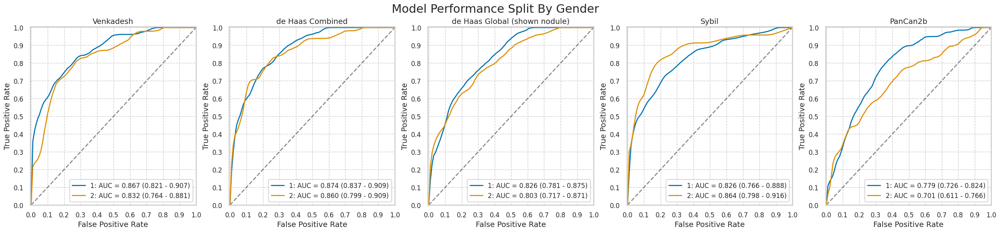

In [19]:
for cat in nlst_democols['cat']['demo']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Smoking

cigar


,num,pct,num_mal,pct_mal
0.0,931,79.845626,105,11.278195
1.0,235,20.154374,21,8.936170


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,931,96,398,428,9,0.914286,0.481840,0.085714,0.518160,0.194332,0.979405,0.805668,0.020595,0.562836
1.0,235,20,91,123,1,0.952381,0.425234,0.047619,0.574766,0.180180,0.991935,0.819820,0.008065,0.608511


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,931,102,470,356,3,0.971429,0.569007,0.028571,0.430993,0.178322,0.991643,0.821678,0.008357,0.491944
1.0,235,19,107,107,2,0.904762,0.500000,0.095238,0.500000,0.150794,0.981651,0.849206,0.018349,0.536170


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,931,82,260,566,23,0.780952,0.314770,0.219048,0.685230,0.239766,0.960951,0.760234,0.039049,0.696026
1.0,235,15,80,134,6,0.714286,0.373832,0.285714,0.626168,0.157895,0.957143,0.842105,0.042857,0.634043


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,931,83,192,634,22,0.790476,0.232446,0.209524,0.767554,0.301818,0.966463,0.698182,0.033537,0.770140
1.0,235,14,46,168,7,0.666667,0.214953,0.333333,0.785047,0.233333,0.960000,0.766667,0.040000,0.774468


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,931,93,521,305,12,0.885714,0.630751,0.114286,0.369249,0.151466,0.962145,0.848534,0.037855,0.427497
1.0,235,19,111,103,2,0.904762,0.518692,0.095238,0.481308,0.146154,0.980952,0.853846,0.019048,0.519149


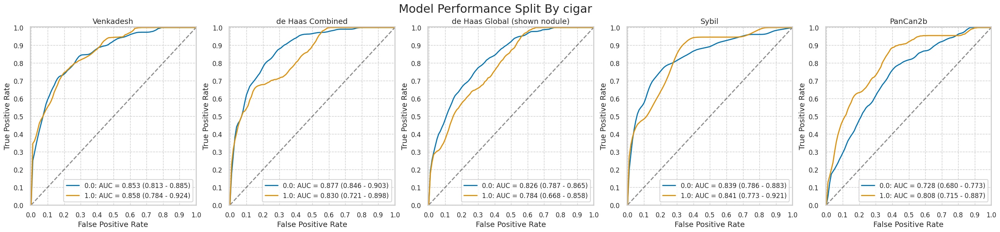

cigsmok


,num,pct,num_mal,pct_mal
0,560,47.78157,46,8.214286
1,612,52.21843,81,13.235294


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,560,45,229,285,1,0.978261,0.445525,0.021739,0.554475,0.164234,0.996503,0.835766,0.003497,0.589286
1,612,72,261,270,9,0.888889,0.491525,0.111111,0.508475,0.216216,0.967742,0.783784,0.032258,0.558824


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,560,44,261,253,2,0.956522,0.507782,0.043478,0.492218,0.144262,0.992157,0.855738,0.007843,0.530357
1,612,78,318,213,3,0.962963,0.598870,0.037037,0.401130,0.196970,0.986111,0.803030,0.013889,0.475490


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,560,31,162,352,15,0.673913,0.315175,0.326087,0.684825,0.160622,0.959128,0.839378,0.040872,0.683929
1,612,67,178,353,14,0.827160,0.335217,0.172840,0.664783,0.273469,0.961853,0.726531,0.038147,0.686275


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,560,35,119,395,11,0.760870,0.231518,0.239130,0.768482,0.227273,0.972906,0.772727,0.027094,0.767857
1,612,63,120,411,18,0.777778,0.225989,0.222222,0.774011,0.344262,0.958042,0.655738,0.041958,0.774510


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,560,39,323,191,7,0.847826,0.628405,0.152174,0.371595,0.107735,0.964646,0.892265,0.035354,0.410714
1,612,74,310,221,7,0.913580,0.583804,0.086420,0.416196,0.192708,0.969298,0.807292,0.030702,0.482026


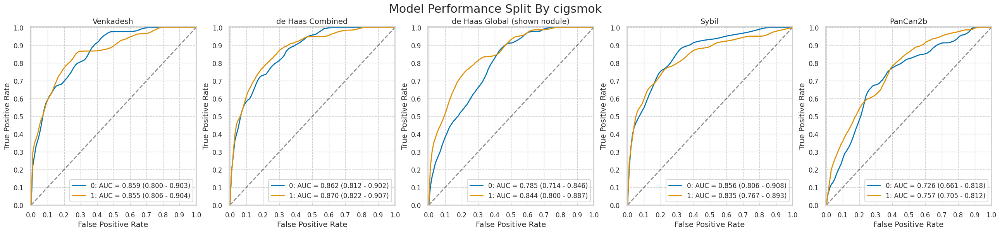

pipe


,num,pct,num_mal,pct_mal
0.0,882,75.708155,87,9.863946
1.0,283,24.291845,39,13.780919


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,882,78,388,407,9,0.896552,0.488050,0.103448,0.511950,0.167382,0.978365,0.832618,0.021635,0.549887
1.0,283,38,100,144,1,0.974359,0.409836,0.025641,0.590164,0.275362,0.993103,0.724638,0.006897,0.643110


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,882,83,452,343,4,0.954023,0.568553,0.045977,0.431447,0.155140,0.988473,0.844860,0.011527,0.482993
1.0,283,38,124,120,1,0.974359,0.508197,0.025641,0.491803,0.234568,0.991736,0.765432,0.008264,0.558304


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,882,67,247,548,20,0.770115,0.310692,0.229885,0.689308,0.213376,0.964789,0.786624,0.035211,0.697279
1.0,283,30,93,151,9,0.769231,0.381148,0.230769,0.618852,0.243902,0.943750,0.756098,0.056250,0.639576


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,882,67,193,602,20,0.770115,0.242767,0.229885,0.757233,0.257692,0.967846,0.742308,0.032154,0.758503
1.0,283,30,44,200,9,0.769231,0.180328,0.230769,0.819672,0.405405,0.956938,0.594595,0.043062,0.812721


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,882,76,502,293,11,0.873563,0.631447,0.126437,0.368553,0.131488,0.963816,0.868512,0.036184,0.418367
1.0,283,36,130,114,3,0.923077,0.532787,0.076923,0.467213,0.216867,0.974359,0.783133,0.025641,0.530035


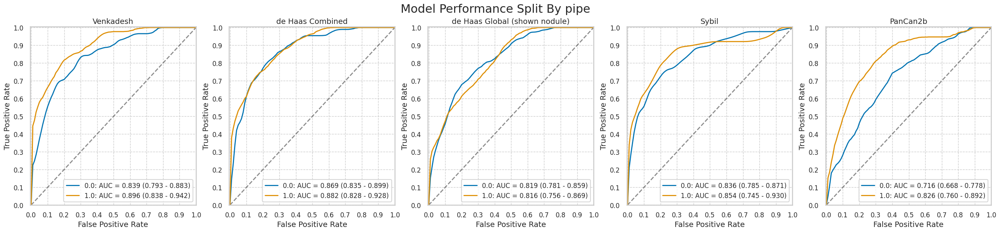

smokelive


,num,pct,num_mal,pct_mal
0.0,139,11.910883,13,9.352518
1.0,1028,88.089117,113,10.992218


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,139,12,56,70,1,0.923077,0.444444,0.076923,0.555556,0.176471,0.985915,0.823529,0.014085,0.589928
1.0,1028,104,433,482,9,0.920354,0.473224,0.079646,0.526776,0.193669,0.981670,0.806331,0.018330,0.570039


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,139,12,70,56,1,0.923077,0.555556,0.076923,0.444444,0.146341,0.982456,0.853659,0.017544,0.489209
1.0,1028,109,507,408,4,0.964602,0.554098,0.035398,0.445902,0.176948,0.990291,0.823052,0.009709,0.502918


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,139,8,31,95,5,0.615385,0.246032,0.384615,0.753968,0.205128,0.950000,0.794872,0.050000,0.741007
1.0,1028,89,309,606,24,0.787611,0.337705,0.212389,0.662295,0.223618,0.961905,0.776382,0.038095,0.676070


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,139,10,27,99,3,0.769231,0.214286,0.230769,0.785714,0.270270,0.970588,0.729730,0.029412,0.784173
1.0,1028,87,211,704,26,0.769912,0.230601,0.230088,0.769399,0.291946,0.964384,0.708054,0.035616,0.769455


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,139,12,74,52,1,0.923077,0.587302,0.076923,0.412698,0.139535,0.981132,0.860465,0.018868,0.460432
1.0,1028,100,558,357,13,0.884956,0.609836,0.115044,0.390164,0.151976,0.964865,0.848024,0.035135,0.444553


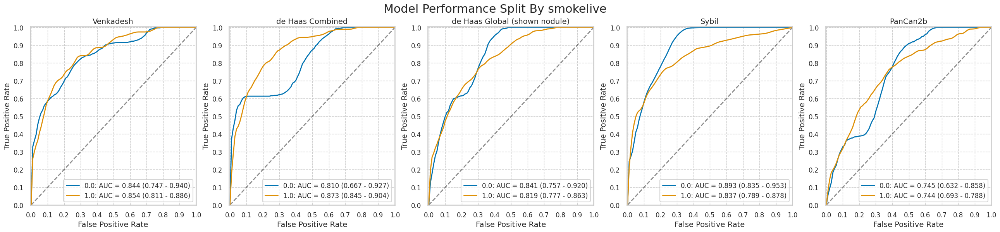

smokework


,num,pct,num_mal,pct_mal
0.0,150,12.931034,16,10.666667
1.0,1010,87.068966,111,10.990099


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,150,14,65,69,2,0.875000,0.485075,0.125000,0.514925,0.177215,0.971831,0.822785,0.028169,0.553333
1.0,1010,103,420,479,8,0.927928,0.467186,0.072072,0.532814,0.196941,0.983573,0.803059,0.016427,0.576238


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,150,15,73,61,1,0.937500,0.544776,0.062500,0.455224,0.170455,0.983871,0.829545,0.016129,0.506667
1.0,1010,107,501,398,4,0.963964,0.557286,0.036036,0.442714,0.175987,0.990050,0.824013,0.009950,0.500000


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,150,13,41,93,3,0.812500,0.305970,0.187500,0.694030,0.240741,0.968750,0.759259,0.031250,0.706667
1.0,1010,85,296,603,26,0.765766,0.329255,0.234234,0.670745,0.223097,0.958665,0.776903,0.041335,0.681188


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,150,12,30,104,4,0.750000,0.223881,0.250000,0.776119,0.285714,0.962963,0.714286,0.037037,0.773333
1.0,1010,86,208,691,25,0.774775,0.231368,0.225225,0.768632,0.292517,0.965084,0.707483,0.034916,0.769307


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,150,12,91,43,4,0.75000,0.679104,0.25000,0.320896,0.116505,0.914894,0.883495,0.085106,0.366667
1.0,1010,101,535,364,10,0.90991,0.595106,0.09009,0.404894,0.158805,0.973262,0.841195,0.026738,0.460396


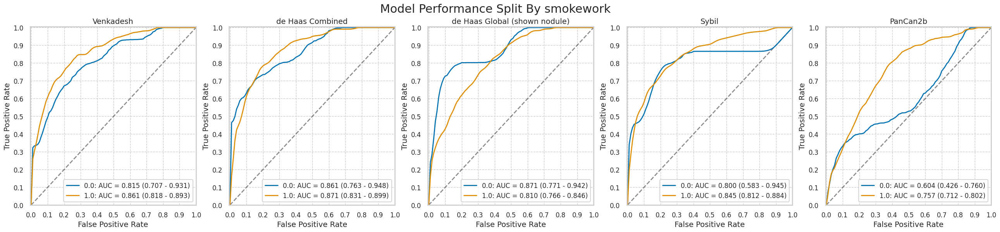

In [20]:
for cat in nlst_democols['cat']['smoke']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Work history

wrkasbe


,num,pct,num_mal,pct_mal
0.0,1082,92.320819,118,10.90573
1.0,90,7.679181,9,10.00000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1082,108,443,521,10,0.915254,0.459544,0.084746,0.540456,0.196007,0.981168,0.803993,0.018832,0.581331
1.0,90,9,47,34,0,1.000000,0.580247,0.000000,0.419753,0.160714,1.000000,0.839286,0.000000,0.477778


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1082,114,533,431,4,0.966102,0.552905,0.033898,0.447095,0.176198,0.990805,0.823802,0.009195,0.503697
1.0,90,8,46,35,1,0.888889,0.567901,0.111111,0.432099,0.148148,0.972222,0.851852,0.027778,0.477778


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1082,89,314,650,29,0.754237,0.325726,0.245763,0.674274,0.220844,0.95729,0.779156,0.04271,0.682994
1.0,90,9,26,55,0,1.000000,0.320988,0.000000,0.679012,0.257143,1.00000,0.742857,0.00000,0.711111


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1082,92,205,759,26,0.779661,0.212656,0.220339,0.787344,0.309764,0.966879,0.690236,0.033121,0.786506
1.0,90,6,34,47,3,0.666667,0.419753,0.333333,0.580247,0.150000,0.940000,0.850000,0.060000,0.588889


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1082,105,574,390,13,0.889831,0.595436,0.110169,0.404564,0.154639,0.967742,0.845361,0.032258,0.457486
1.0,90,8,59,22,1,0.888889,0.728395,0.111111,0.271605,0.119403,0.956522,0.880597,0.043478,0.333333


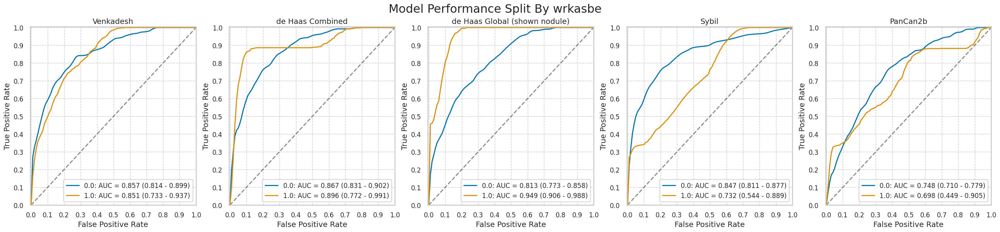

wrkbaki


,num,pct,num_mal,pct_mal
0.0,1145,97.696246,124,10.829694
1.0,27,2.303754,3,11.111111


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkbutc


,num,pct,num_mal,pct_mal
0.0,1154,98.464164,124,10.745234
1.0,18,1.535836,3,16.666667


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkchem


,num,pct,num_mal,pct_mal
0.0,1087,92.826644,120,11.039558
1.0,84,7.173356,7,8.333333


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1087,110,457,510,10,0.916667,0.472596,0.083333,0.527404,0.194004,0.980769,0.805996,0.019231,0.570377
1.0,84,7,33,44,0,1.000000,0.428571,0.000000,0.571429,0.175000,1.000000,0.825000,0.000000,0.607143


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1087,115,545,422,5,0.958333,0.563599,0.041667,0.436401,0.174242,0.98829,0.825758,0.01171,0.494020
1.0,84,7,33,44,0,1.000000,0.428571,0.000000,0.571429,0.175000,1.00000,0.825000,0.00000,0.607143


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1087,92,318,649,28,0.766667,0.328852,0.233333,0.671148,0.224390,0.958641,0.775610,0.041359,0.681693
1.0,84,6,21,56,1,0.857143,0.272727,0.142857,0.727273,0.222222,0.982456,0.777778,0.017544,0.738095


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1087,94,219,748,26,0.783333,0.226474,0.216667,0.773526,0.300319,0.966408,0.699681,0.033592,0.774609
1.0,84,4,20,57,3,0.571429,0.259740,0.428571,0.740260,0.166667,0.950000,0.833333,0.050000,0.726190


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1087,107,590,377,13,0.891667,0.610134,0.108333,0.389866,0.153515,0.966667,0.846485,0.033333,0.445262
1.0,84,6,43,34,1,0.857143,0.558442,0.142857,0.441558,0.122449,0.971429,0.877551,0.028571,0.476190


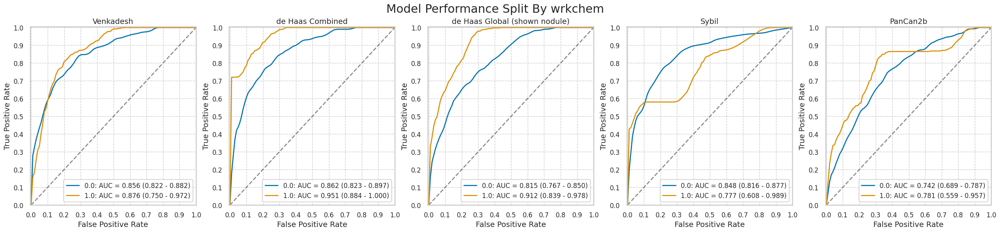

wrkcoal


,num,pct,num_mal,pct_mal
0.0,1169,99.744027,126,10.778443
1.0,3,0.255973,1,33.333333


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkcott


,num,pct,num_mal,pct_mal
0.0,1164,99.317406,125,10.738832
1.0,8,0.682594,2,25.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkfarm


,num,pct,num_mal,pct_mal
0.0,1019,86.945392,119,11.678116
1.0,153,13.054608,8,5.228758


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1019,109,431,469,10,0.915966,0.478889,0.084034,0.521111,0.201852,0.979123,0.798148,0.020877,0.567223
1.0,153,8,59,86,0,1.000000,0.406897,0.000000,0.593103,0.119403,1.000000,0.880597,0.000000,0.614379


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1019,114,516,384,5,0.957983,0.573333,0.042017,0.426667,0.180952,0.987147,0.819048,0.012853,0.488714
1.0,153,8,63,82,0,1.000000,0.434483,0.000000,0.565517,0.112676,1.000000,0.887324,0.000000,0.588235


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1019,91,290,610,28,0.764706,0.322222,0.235294,0.677778,0.238845,0.956113,0.761155,0.043887,0.687929
1.0,153,7,50,95,1,0.875000,0.344828,0.125000,0.655172,0.122807,0.989583,0.877193,0.010417,0.666667


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1019,93,204,696,26,0.781513,0.226667,0.218487,0.773333,0.313131,0.963989,0.686869,0.036011,0.774289
1.0,153,5,35,110,3,0.625000,0.241379,0.375000,0.758621,0.125000,0.973451,0.875000,0.026549,0.751634


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1019,106,554,346,13,0.890756,0.615556,0.109244,0.384444,0.160606,0.963788,0.839394,0.036212,0.443572
1.0,153,7,79,66,1,0.875000,0.544828,0.125000,0.455172,0.081395,0.985075,0.918605,0.014925,0.477124


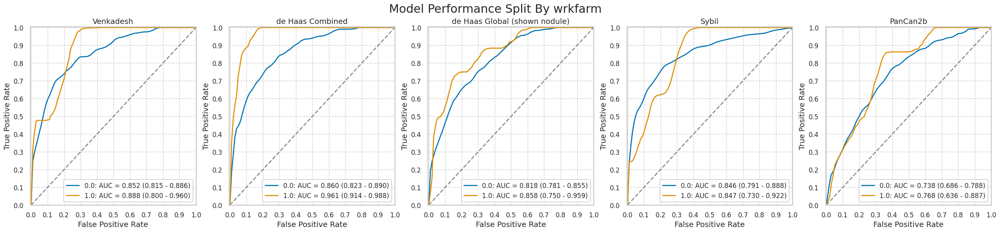

wrkfire


,num,pct,num_mal,pct_mal
0.0,1153,98.37884,124,10.754553
1.0,19,1.62116,3,15.789474


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkflou


,num,pct,num_mal,pct_mal
0.0,1153,98.37884,127,11.014744
1.0,19,1.62116,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkfoun


,num,pct,num_mal,pct_mal
0.0,1124,95.904437,116,10.320285
1.0,48,4.095563,11,22.916667


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1124,108,470,538,8,0.931034,0.466270,0.068966,0.533730,0.186851,0.985348,0.813149,0.014652,0.574733
1.0,48,9,20,17,2,0.818182,0.540541,0.181818,0.459459,0.310345,0.894737,0.689655,0.105263,0.541667


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1124,111,559,449,5,0.956897,0.554563,0.043103,0.445437,0.165672,0.988987,0.834328,0.011013,0.498221
1.0,48,11,20,17,0,1.000000,0.540541,0.000000,0.459459,0.354839,1.000000,0.645161,0.000000,0.583333


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1124,89,326,682,27,0.767241,0.323413,0.232759,0.676587,0.214458,0.961918,0.785542,0.038082,0.685943
1.0,48,9,14,23,2,0.818182,0.378378,0.181818,0.621622,0.391304,0.920000,0.608696,0.080000,0.666667


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1124,91,224,784,25,0.784483,0.222222,0.215517,0.777778,0.288889,0.969098,0.711111,0.030902,0.778470
1.0,48,7,15,22,4,0.636364,0.405405,0.363636,0.594595,0.318182,0.846154,0.681818,0.153846,0.604167


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1124,104,609,399,12,0.896552,0.604167,0.103448,0.395833,0.145863,0.970803,0.854137,0.029197,0.447509
1.0,48,9,24,13,2,0.818182,0.648649,0.181818,0.351351,0.272727,0.866667,0.727273,0.133333,0.458333


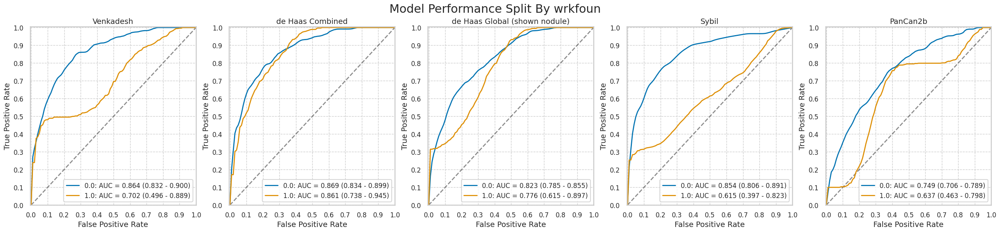

wrkhard


,num,pct,num_mal,pct_mal
0.0,1162,99.146758,127,10.929432
1.0,10,0.853242,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkpain


,num,pct,num_mal,pct_mal
0.0,1099,93.771331,120,10.919017
1.0,73,6.228669,7,9.589041


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1099,110,462,517,10,0.916667,0.471910,0.083333,0.528090,0.192308,0.981025,0.807692,0.018975,0.570519
1.0,73,7,28,38,0,1.000000,0.424242,0.000000,0.575758,0.200000,1.000000,0.800000,0.000000,0.616438


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1099,115,546,433,5,0.958333,0.557712,0.041667,0.442288,0.173979,0.988584,0.826021,0.011416,0.498635
1.0,73,7,33,33,0,1.000000,0.500000,0.000000,0.500000,0.175000,1.000000,0.825000,0.000000,0.547945


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1099,92,316,663,28,0.766667,0.322778,0.233333,0.677222,0.22549,0.959479,0.77451,0.040521,0.686988
1.0,73,6,24,42,1,0.857143,0.363636,0.142857,0.636364,0.20000,0.976744,0.80000,0.023256,0.657534


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1099,92,223,756,28,0.766667,0.227783,0.233333,0.772217,0.292063,0.964286,0.707937,0.035714,0.771611
1.0,73,6,16,50,1,0.857143,0.242424,0.142857,0.757576,0.272727,0.980392,0.727273,0.019608,0.767123


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1099,106,597,382,14,0.883333,0.609806,0.116667,0.390194,0.150782,0.964646,0.849218,0.035354,0.444040
1.0,73,7,36,30,0,1.000000,0.545455,0.000000,0.454545,0.162791,1.000000,0.837209,0.000000,0.506849


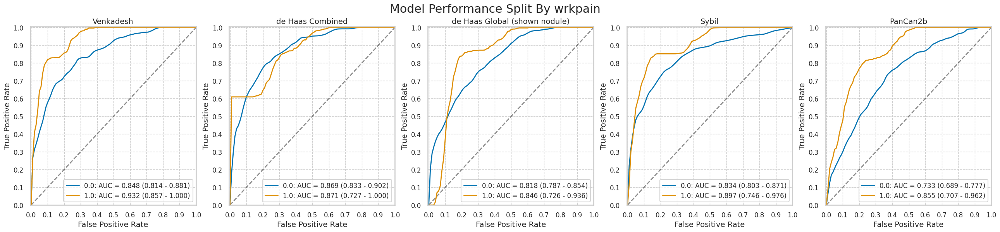

wrksand


,num,pct,num_mal,pct_mal
0.0,1142,97.440273,120,10.507881
1.0,30,2.559727,7,23.333333


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1142,110,474,548,10,0.916667,0.463796,0.083333,0.536204,0.188356,0.982079,0.811644,0.017921,0.576182
1.0,30,7,16,7,0,1.000000,0.695652,0.000000,0.304348,0.304348,1.000000,0.695652,0.000000,0.466667


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1142,116,561,461,4,0.966667,0.548924,0.033333,0.451076,0.171344,0.991398,0.828656,0.008602,0.505254
1.0,30,6,18,5,1,0.857143,0.782609,0.142857,0.217391,0.250000,0.833333,0.750000,0.166667,0.366667


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1142,92,332,690,28,0.766667,0.324853,0.233333,0.675147,0.216981,0.961003,0.783019,0.038997,0.684764
1.0,30,6,8,15,1,0.857143,0.347826,0.142857,0.652174,0.428571,0.937500,0.571429,0.062500,0.700000


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1142,93,235,787,27,0.775000,0.229941,0.225000,0.770059,0.283537,0.966830,0.716463,0.033170,0.770578
1.0,30,5,4,19,2,0.714286,0.173913,0.285714,0.826087,0.555556,0.904762,0.444444,0.095238,0.800000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1142,106,617,405,14,0.883333,0.603718,0.116667,0.396282,0.146611,0.966587,0.853389,0.033413,0.447461
1.0,30,7,16,7,0,1.000000,0.695652,0.000000,0.304348,0.304348,1.000000,0.695652,0.000000,0.466667


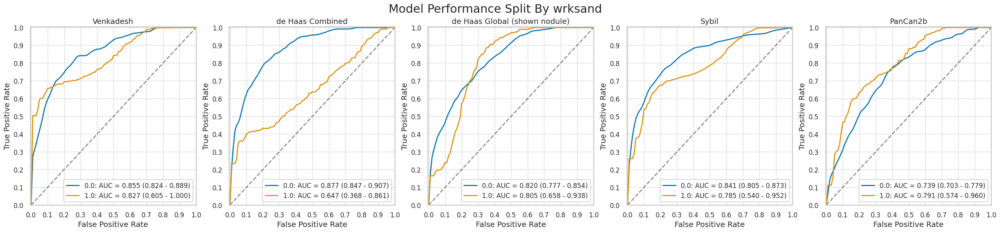

wrkweld


,num,pct,num_mal,pct_mal
0.0,1092,93.174061,116,10.622711
1.0,80,6.825939,11,13.750000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1092,106,452,524,10,0.913793,0.463115,0.086207,0.536885,0.189964,0.981273,0.810036,0.018727,0.576923
1.0,80,11,38,31,0,1.000000,0.550725,0.000000,0.449275,0.224490,1.000000,0.775510,0.000000,0.525000


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1092,111,541,435,5,0.956897,0.554303,0.043103,0.445697,0.170245,0.988636,0.829755,0.011364,0.500
1.0,80,11,38,31,0,1.000000,0.550725,0.000000,0.449275,0.224490,1.000000,0.775510,0.000000,0.525


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1092,89,312,664,27,0.767241,0.319672,0.232759,0.680328,0.221945,0.960926,0.778055,0.039074,0.68956
1.0,80,9,28,41,2,0.818182,0.405797,0.181818,0.594203,0.243243,0.953488,0.756757,0.046512,0.62500


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1092,90,218,758,26,0.775862,0.223361,0.224138,0.776639,0.292208,0.966837,0.707792,0.033163,0.776557
1.0,80,8,21,48,3,0.727273,0.304348,0.272727,0.695652,0.275862,0.941176,0.724138,0.058824,0.700000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1092,103,585,391,13,0.887931,0.599385,0.112069,0.400615,0.149709,0.967822,0.850291,0.032178,0.452381
1.0,80,10,48,21,1,0.909091,0.695652,0.090909,0.304348,0.172414,0.954545,0.827586,0.045455,0.387500


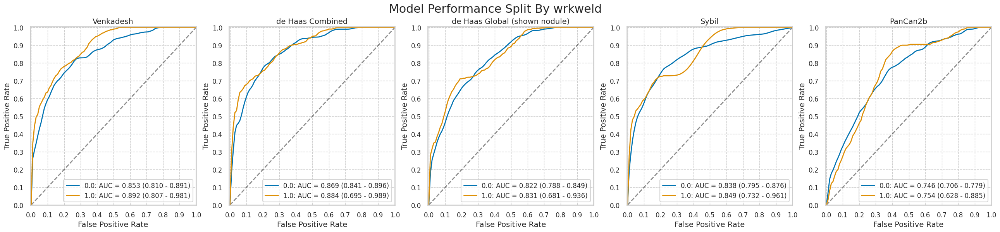

wrknomask


,num,pct,num_mal,pct_mal
False,872,74.40273,102,11.697248
True,300,25.59727,25,8.333333


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,872,94,370,400,8,0.921569,0.480519,0.078431,0.519481,0.202586,0.980392,0.797414,0.019608,0.566514
True,300,23,120,155,2,0.920000,0.436364,0.080000,0.563636,0.160839,0.987261,0.839161,0.012739,0.593333


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,872,98,445,325,4,0.960784,0.577922,0.039216,0.422078,0.180479,0.987842,0.819521,0.012158,0.485092
True,300,24,134,141,1,0.960000,0.487273,0.040000,0.512727,0.151899,0.992958,0.848101,0.007042,0.550000


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,872,78,243,527,24,0.764706,0.315584,0.235294,0.684416,0.242991,0.956443,0.757009,0.043557,0.693807
True,300,20,97,178,5,0.800000,0.352727,0.200000,0.647273,0.170940,0.972678,0.829060,0.027322,0.660000


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,872,81,172,598,21,0.794118,0.223377,0.205882,0.776623,0.320158,0.966074,0.679842,0.033926,0.77867
True,300,17,67,208,8,0.680000,0.243636,0.320000,0.756364,0.202381,0.962963,0.797619,0.037037,0.75000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,872,91,475,295,11,0.892157,0.616883,0.107843,0.383117,0.160777,0.964052,0.839223,0.035948,0.442661
True,300,22,158,117,3,0.880000,0.574545,0.120000,0.425455,0.122222,0.975000,0.877778,0.025000,0.463333


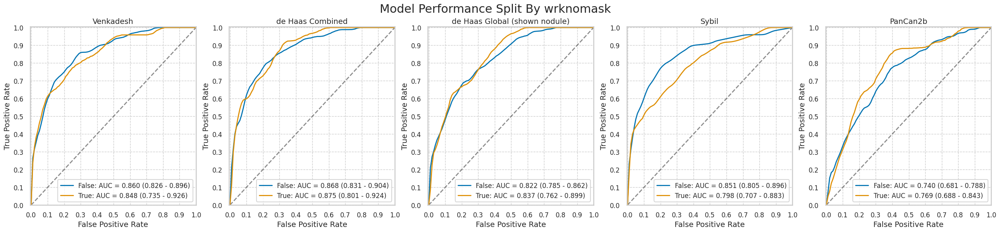

In [21]:
for cat in nlst_democols['cat']['work']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Disease history

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,733,67,299,364,3,0.957143,0.45098,0.042857,0.54902,0.183060,0.991826,0.816940,0.008174,0.587995
True,439,50,191,191,7,0.877193,0.50000,0.122807,0.50000,0.207469,0.964646,0.792531,0.035354,0.548975


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,733,68,361,302,2,0.971429,0.544495,0.028571,0.455505,0.158508,0.993421,0.841492,0.006579,0.504775
True,439,54,218,164,3,0.947368,0.570681,0.052632,0.429319,0.198529,0.982036,0.801471,0.017964,0.496583


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,733,57,204,459,13,0.814286,0.307692,0.185714,0.692308,0.218391,0.972458,0.781609,0.027542,0.703956
True,439,41,136,246,16,0.719298,0.356021,0.280702,0.643979,0.231638,0.938931,0.768362,0.061069,0.653759


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,733,58,137,526,12,0.828571,0.206637,0.171429,0.793363,0.297436,0.977695,0.702564,0.022305,0.796726
True,439,40,102,280,17,0.701754,0.267016,0.298246,0.732984,0.281690,0.942761,0.718310,0.057239,0.728929


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,733,64,376,287,6,0.914286,0.567119,0.085714,0.432881,0.145455,0.979522,0.854545,0.020478,0.478854
True,439,49,257,125,8,0.859649,0.672775,0.140351,0.327225,0.160131,0.939850,0.839869,0.060150,0.396355


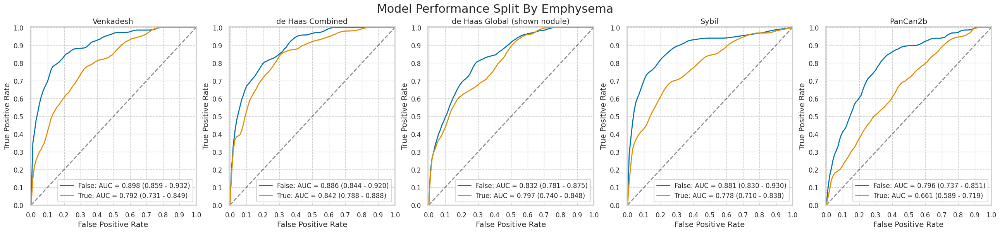

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


In [22]:
plot_by_category(nlst_preds, 'Emphysema')

diagadas


,num,pct,num_mal,pct_mal
0.0,1102,94.027304,118,10.707804
1.0,70,5.972696,9,12.857143


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1102,109,453,531,9,0.923729,0.460366,0.076271,0.539634,0.193950,0.983333,0.806050,0.016667,0.580762
1.0,70,8,37,24,1,0.888889,0.606557,0.111111,0.393443,0.177778,0.960000,0.822222,0.040000,0.457143


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1102,113,535,449,5,0.957627,0.543699,0.042373,0.456301,0.174383,0.988987,0.825617,0.011013,0.509982
1.0,70,9,44,17,0,1.000000,0.721311,0.000000,0.278689,0.169811,1.000000,0.830189,0.000000,0.371429


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1102,90,314,670,28,0.762712,0.319106,0.237288,0.680894,0.222772,0.959885,0.777228,0.040115,0.689655
1.0,70,8,26,35,1,0.888889,0.426230,0.111111,0.573770,0.235294,0.972222,0.764706,0.027778,0.614286


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1102,94,212,772,24,0.796610,0.215447,0.203390,0.784553,0.307190,0.969849,0.692810,0.030151,0.785844
1.0,70,4,27,34,5,0.444444,0.442623,0.555556,0.557377,0.129032,0.871795,0.870968,0.128205,0.542857


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1102,106,586,398,12,0.898305,0.595528,0.101695,0.404472,0.153179,0.970732,0.846821,0.029268,0.45735
1.0,70,7,47,14,2,0.777778,0.770492,0.222222,0.229508,0.129630,0.875000,0.870370,0.125000,0.30000


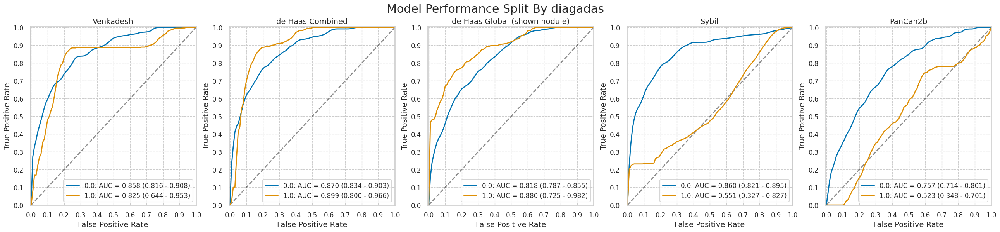

diagasbe


,num,pct,num_mal,pct_mal
0.0,1147,98.034188,127,11.072363
1.0,23,1.965812,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagbron


,num,pct,num_mal,pct_mal
0.0,1121,95.811966,124,11.061552
1.0,49,4.188034,3,6.122449


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagchas


,num,pct,num_mal,pct_mal
0.0,1138,97.098976,125,10.984183
1.0,34,2.901024,2,5.882353


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagchro


,num,pct,num_mal,pct_mal
0.0,1035,88.613014,110,10.628019
1.0,133,11.386986,17,12.781955


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1035,101,431,494,9,0.918182,0.465946,0.081818,0.534054,0.189850,0.982107,0.810150,0.017893,0.574879
1.0,133,16,55,61,1,0.941176,0.474138,0.058824,0.525862,0.225352,0.983871,0.774648,0.016129,0.578947


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1035,105,517,408,5,0.954545,0.558919,0.045455,0.441081,0.168810,0.987893,0.831190,0.012107,0.495652
1.0,133,17,59,57,0,1.000000,0.508621,0.000000,0.491379,0.223684,1.000000,0.776316,0.000000,0.556391


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1035,81,303,622,29,0.736364,0.327568,0.263636,0.672432,0.210938,0.955453,0.789062,0.044547,0.679227
1.0,133,17,34,82,0,1.000000,0.293103,0.000000,0.706897,0.333333,1.000000,0.666667,0.000000,0.744361


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1035,86,200,725,24,0.781818,0.216216,0.218182,0.783784,0.300699,0.967957,0.699301,0.032043,0.783575
1.0,133,12,38,78,5,0.705882,0.327586,0.294118,0.672414,0.240000,0.939759,0.760000,0.060241,0.676692


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1035,98,558,367,12,0.890909,0.603243,0.109091,0.396757,0.149390,0.968338,0.850610,0.031662,0.449275
1.0,133,15,74,42,2,0.882353,0.637931,0.117647,0.362069,0.168539,0.954545,0.831461,0.045455,0.428571


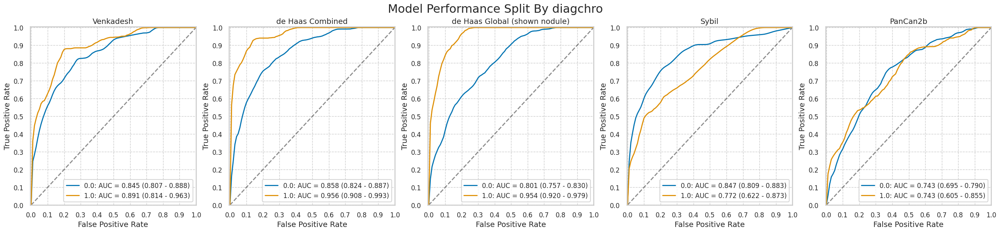

diagcopd


,num,pct,num_mal,pct_mal
0.0,1088,92.991453,120,11.029412
1.0,82,7.008547,7,8.536585


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1088,110,448,520,10,0.916667,0.462810,0.083333,0.537190,0.197133,0.981132,0.802867,0.018868,0.579044
1.0,82,7,41,34,0,1.000000,0.546667,0.000000,0.453333,0.145833,1.000000,0.854167,0.000000,0.500000


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1088,115,537,431,5,0.958333,0.554752,0.041667,0.445248,0.176380,0.988532,0.823620,0.011468,0.501838
1.0,82,7,42,33,0,1.000000,0.560000,0.000000,0.440000,0.142857,1.000000,0.857143,0.000000,0.487805


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1088,92,319,649,28,0.766667,0.329545,0.233333,0.670455,0.223844,0.958641,0.776156,0.041359,0.681066
1.0,82,6,21,54,1,0.857143,0.280000,0.142857,0.720000,0.222222,0.981818,0.777778,0.018182,0.731707


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1088,91,209,759,29,0.758333,0.215909,0.241667,0.784091,0.303333,0.963198,0.696667,0.036802,0.781250
1.0,82,7,29,46,0,1.000000,0.386667,0.000000,0.613333,0.194444,1.000000,0.805556,0.000000,0.646341


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1088,106,572,396,14,0.883333,0.590909,0.116667,0.409091,0.156342,0.965854,0.843658,0.034146,0.461397
1.0,82,7,60,15,0,1.000000,0.800000,0.000000,0.200000,0.104478,1.000000,0.895522,0.000000,0.268293


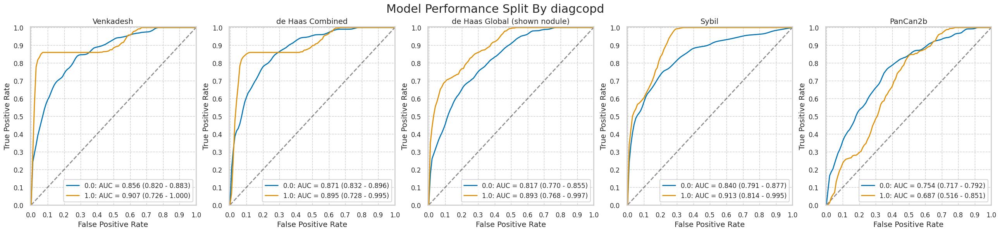

diagdiab


,num,pct,num_mal,pct_mal
0.0,1046,89.249147,108,10.325048
1.0,126,10.750853,19,15.079365


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1046,102,445,493,6,0.944444,0.474414,0.055556,0.525586,0.186472,0.987976,0.813528,0.012024,0.568834
1.0,126,15,45,62,4,0.789474,0.420561,0.210526,0.579439,0.250000,0.939394,0.750000,0.060606,0.611111


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1046,104,525,413,4,0.962963,0.559701,0.037037,0.440299,0.165342,0.990408,0.834658,0.009592,0.494264
1.0,126,18,54,53,1,0.947368,0.504673,0.052632,0.495327,0.250000,0.981481,0.750000,0.018519,0.563492


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1046,83,313,625,25,0.768519,0.333689,0.231481,0.666311,0.209596,0.961538,0.790404,0.038462,0.676864
1.0,126,15,27,80,4,0.789474,0.252336,0.210526,0.747664,0.357143,0.952381,0.642857,0.047619,0.753968


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1046,85,218,720,23,0.787037,0.232409,0.212963,0.767591,0.280528,0.969044,0.719472,0.030956,0.769598
1.0,126,13,21,86,6,0.684211,0.196262,0.315789,0.803738,0.382353,0.934783,0.617647,0.065217,0.785714


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1046,95,567,371,13,0.879630,0.604478,0.120370,0.395522,0.143505,0.966146,0.856495,0.033854,0.445507
1.0,126,18,66,41,1,0.947368,0.616822,0.052632,0.383178,0.214286,0.976190,0.785714,0.023810,0.468254


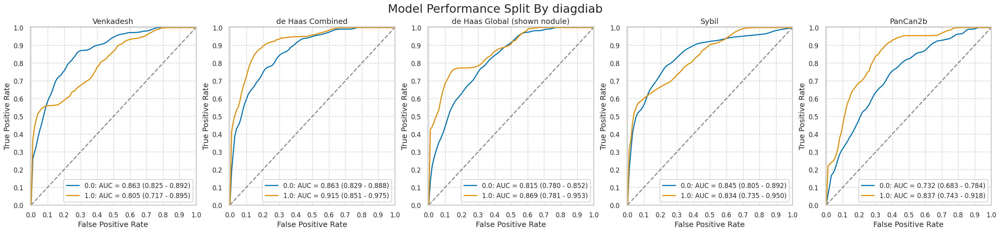

diagemph


,num,pct,num_mal,pct_mal
0.0,1031,88.270548,112,10.863240
1.0,137,11.729452,15,10.948905


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1031,103,422,497,9,0.919643,0.459195,0.080357,0.540805,0.19619,0.982213,0.80381,0.017787,0.581959
1.0,137,14,67,55,1,0.933333,0.549180,0.066667,0.450820,0.17284,0.982143,0.82716,0.017857,0.503650


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1031,107,508,411,5,0.955357,0.552775,0.044643,0.447225,0.173984,0.987981,0.826016,0.012019,0.502425
1.0,137,15,71,51,0,1.000000,0.581967,0.000000,0.418033,0.174419,1.000000,0.825581,0.000000,0.481752


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1031,85,303,616,27,0.758929,0.329706,0.241071,0.670294,0.219072,0.958009,0.780928,0.041991,0.679922
1.0,137,13,37,85,2,0.866667,0.303279,0.133333,0.696721,0.260000,0.977011,0.740000,0.022989,0.715328


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1031,84,194,725,28,0.750000,0.211099,0.250000,0.788901,0.302158,0.962815,0.697842,0.037185,0.784675
1.0,137,14,45,77,1,0.933333,0.368852,0.066667,0.631148,0.237288,0.987179,0.762712,0.012821,0.664234


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1031,98,546,373,14,0.875,0.594124,0.125,0.405876,0.152174,0.963824,0.847826,0.036176,0.456838
1.0,137,15,84,38,0,1.000,0.688525,0.000,0.311475,0.151515,1.000000,0.848485,0.000000,0.386861


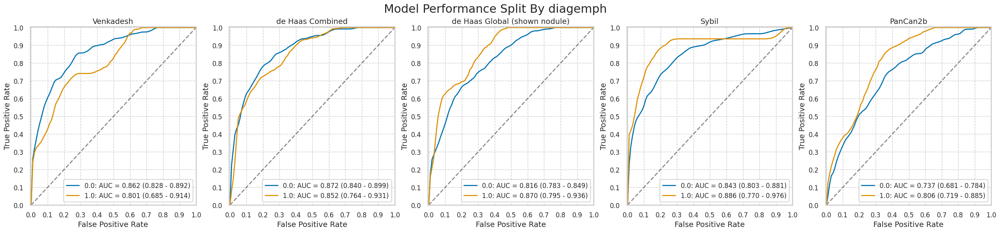

diagfibr


,num,pct,num_mal,pct_mal
0.0,1166,99.488055,127,10.891938
1.0,6,0.511945,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diaghear


,num,pct,num_mal,pct_mal
0.0,1017,87.071918,114,11.209440
1.0,151,12.928082,13,8.609272


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1017,105,415,488,9,0.921053,0.459579,0.078947,0.540421,0.201923,0.981891,0.798077,0.018109,0.583088
1.0,151,12,75,63,1,0.923077,0.543478,0.076923,0.456522,0.137931,0.984375,0.862069,0.015625,0.496689


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1017,109,502,401,5,0.95614,0.555925,0.04386,0.444075,0.178396,0.987685,0.821604,0.012315,0.501475
1.0,151,13,77,61,0,1.00000,0.557971,0.00000,0.442029,0.144444,1.000000,0.855556,0.000000,0.490066


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1017,85,303,600,29,0.745614,0.335548,0.254386,0.664452,0.219072,0.953895,0.780928,0.046105,0.673550
1.0,151,13,36,102,0,1.000000,0.260870,0.000000,0.739130,0.265306,1.000000,0.734694,0.000000,0.761589


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1017,88,201,702,26,0.771930,0.222591,0.228070,0.777409,0.304498,0.964286,0.695502,0.035714,0.776794
1.0,151,10,38,100,3,0.769231,0.275362,0.230769,0.724638,0.208333,0.970874,0.791667,0.029126,0.728477


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1017,101,550,353,13,0.885965,0.609081,0.114035,0.390919,0.155146,0.964481,0.844854,0.035519,0.446411
1.0,151,12,79,59,1,0.923077,0.572464,0.076923,0.427536,0.131868,0.983333,0.868132,0.016667,0.470199


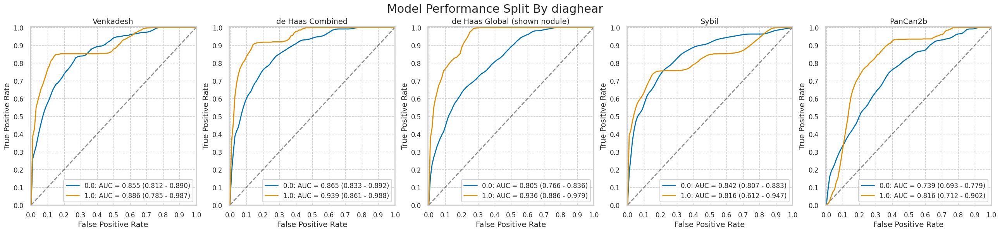

diaghype


,num,pct,num_mal,pct_mal
0.0,778,66.609589,80,10.282776
1.0,390,33.390411,44,11.282051


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,778,75,322,376,5,0.937500,0.461318,0.062500,0.538682,0.188917,0.986877,0.811083,0.013123,0.579692
1.0,390,39,168,178,5,0.886364,0.485549,0.113636,0.514451,0.188406,0.972678,0.811594,0.027322,0.556410


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,778,77,375,323,3,0.962500,0.537249,0.037500,0.462751,0.170354,0.990798,0.829646,0.009202,0.514139
1.0,390,42,204,142,2,0.954545,0.589595,0.045455,0.410405,0.170732,0.986111,0.829268,0.013889,0.471795


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,778,61,215,483,19,0.762500,0.308023,0.237500,0.691977,0.221014,0.962151,0.778986,0.037849,0.699229
1.0,390,34,124,222,10,0.772727,0.358382,0.227273,0.641618,0.215190,0.956897,0.784810,0.043103,0.656410


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,778,61,159,539,19,0.762500,0.227794,0.237500,0.772206,0.277273,0.965950,0.722727,0.034050,0.771208
1.0,390,34,80,266,10,0.772727,0.231214,0.227273,0.768786,0.298246,0.963768,0.701754,0.036232,0.769231


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,778,69,416,282,11,0.862500,0.595989,0.137500,0.404011,0.142268,0.962457,0.857732,0.037543,0.451157
1.0,390,41,216,130,3,0.931818,0.624277,0.068182,0.375723,0.159533,0.977444,0.840467,0.022556,0.438462


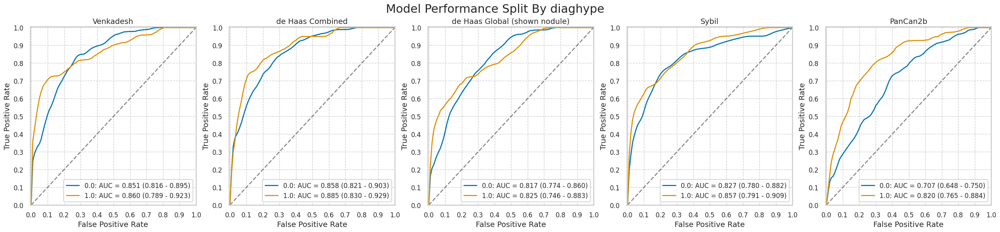

diagpneu


,num,pct,num_mal,pct_mal
0.0,897,76.535836,102,11.371237
1.0,275,23.464164,25,9.090909


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,897,93,362,433,9,0.911765,0.455346,0.088235,0.544654,0.204396,0.979638,0.795604,0.020362,0.586399
1.0,275,24,128,122,1,0.960000,0.512000,0.040000,0.488000,0.157895,0.991870,0.842105,0.008130,0.530909


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,897,99,442,353,3,0.970588,0.555975,0.029412,0.444025,0.182994,0.991573,0.817006,0.008427,0.503902
1.0,275,23,137,113,2,0.920000,0.548000,0.080000,0.452000,0.143750,0.982609,0.856250,0.017391,0.494545


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,897,80,247,548,22,0.784314,0.310692,0.215686,0.689308,0.244648,0.961404,0.755352,0.038596,0.700111
1.0,275,18,93,157,7,0.720000,0.372000,0.280000,0.628000,0.162162,0.957317,0.837838,0.042683,0.636364


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,897,81,161,634,21,0.794118,0.202516,0.205882,0.797484,0.334711,0.967939,0.665289,0.032061,0.797101
1.0,275,17,78,172,8,0.680000,0.312000,0.320000,0.688000,0.178947,0.955556,0.821053,0.044444,0.687273


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,897,90,464,331,12,0.882353,0.583648,0.117647,0.416352,0.162455,0.965015,0.837545,0.034985,0.469342
1.0,275,23,169,81,2,0.920000,0.676000,0.080000,0.324000,0.119792,0.975904,0.880208,0.024096,0.378182


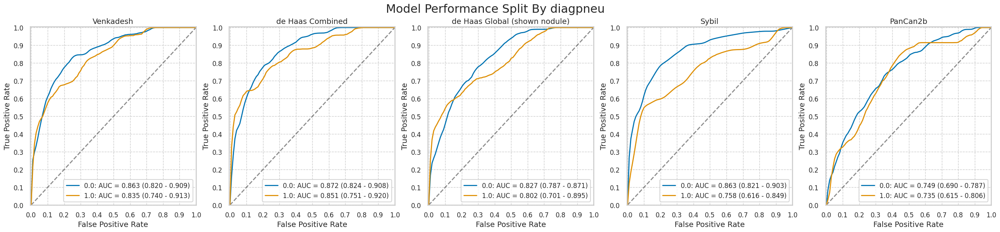

diagsarc


,num,pct,num_mal,pct_mal
0.0,1170,99.829352,126,10.769231
1.0,2,0.170648,1,50.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagsili


,num,pct,num_mal,pct_mal
0.0,1170,99.829352,127,10.854701
1.0,2,0.170648,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagstro


,num,pct,num_mal,pct_mal
0.0,1129,96.331058,117,10.363153
1.0,43,3.668942,10,23.255814


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1129,109,480,532,8,0.931624,0.474308,0.068376,0.525692,0.185059,0.985185,0.814941,0.014815,0.567759
1.0,43,8,10,23,2,0.800000,0.303030,0.200000,0.696970,0.444444,0.920000,0.555556,0.080000,0.720930


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1129,113,558,454,4,0.965812,0.551383,0.034188,0.448617,0.168405,0.991266,0.831595,0.008734,0.502214
1.0,43,9,21,12,1,0.900000,0.636364,0.100000,0.363636,0.300000,0.923077,0.700000,0.076923,0.488372


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1129,91,324,688,26,0.777778,0.320158,0.222222,0.679842,0.219277,0.963585,0.780723,0.036415,0.689991
1.0,43,7,16,17,3,0.700000,0.484848,0.300000,0.515152,0.304348,0.850000,0.695652,0.150000,0.558140


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1129,90,226,786,27,0.769231,0.223320,0.230769,0.776680,0.284810,0.966790,0.715190,0.033210,0.775908
1.0,43,8,13,20,2,0.800000,0.393939,0.200000,0.606061,0.380952,0.909091,0.619048,0.090909,0.651163


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1129,104,611,401,13,0.888889,0.603755,0.111111,0.396245,0.145455,0.968599,0.854545,0.031401,0.447298
1.0,43,9,22,11,1,0.900000,0.666667,0.100000,0.333333,0.290323,0.916667,0.709677,0.083333,0.465116


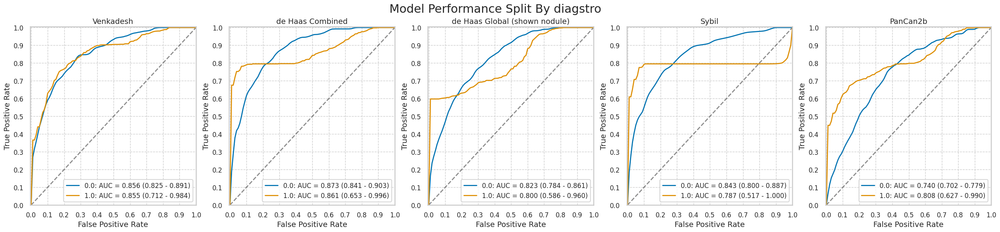

diagtube


,num,pct,num_mal,pct_mal
0.0,1148,97.952218,127,11.062718
1.0,24,2.047782,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(


In [23]:
for cat in nlst_democols['cat']['disease']:
    print(cat)
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

height


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,68.096651,3.856283,59.0,65.0,68.0,71.0,78.0
1,127.0,68.417323,3.736225,60.0,66.0,69.0,71.0,76.0


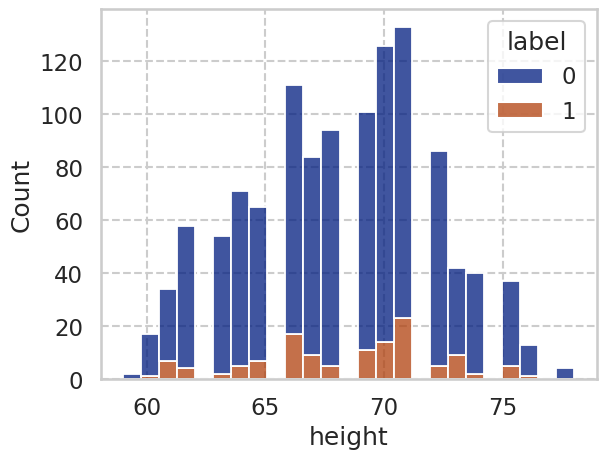

weight


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1044.0,183.356322,39.848243,90.0,157.0,180.0,206.0,315.0
1,127.0,178.244094,36.405720,108.0,157.0,180.0,200.0,322.0


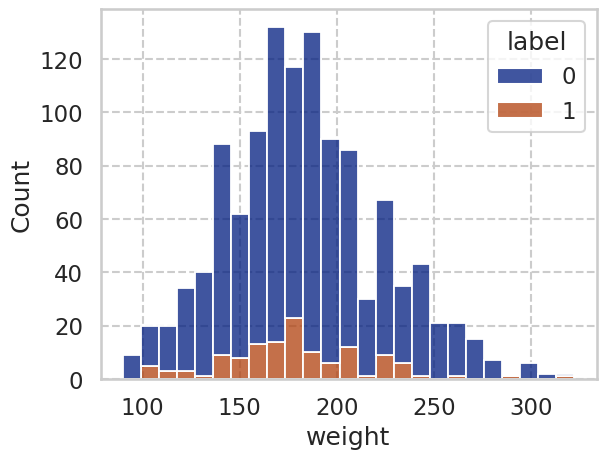

Age


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,63.199043,5.379523,55.0,59.0,62.0,67.0,76.0
1,127.0,64.062992,5.226228,55.0,60.5,63.0,68.0,75.0


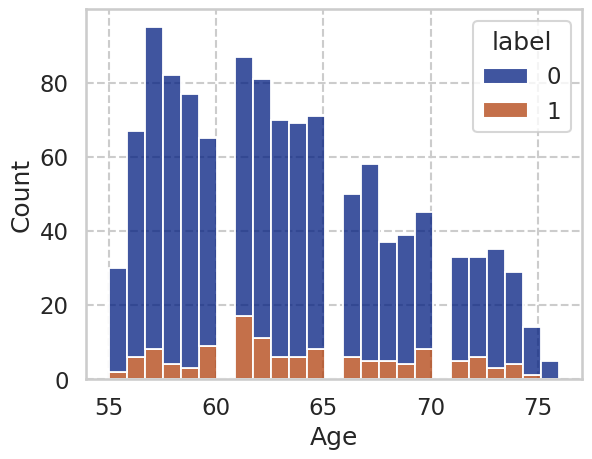

In [24]:
for c in nlst_democols['num']['demo']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"[55, 60)",351.0,0.065527,0.247807,0.0,0.0,0.0,0.0,1.0
"[60, 65)",372.0,0.131720,0.338642,0.0,0.0,0.0,0.0,1.0
"[65, 70)",255.0,0.109804,0.313260,0.0,0.0,0.0,0.0,1.0
"[70, 78)",194.0,0.139175,0.347025,0.0,0.0,0.0,0.0,1.0


,num,pct,num_mal,pct_mal
"[55, 60)",351,29.948805,23,6.552707
"[60, 65)",372,31.740614,49,13.172043
"[65, 70)",255,21.757679,28,10.980392
"[70, 78)",194,16.552901,27,13.917526


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",351,22,142,186,1,0.956522,0.432927,0.043478,0.567073,0.134146,0.994652,0.865854,0.005348,0.592593
"[60, 65)",372,45,143,180,4,0.918367,0.442724,0.081633,0.557276,0.239362,0.978261,0.760638,0.021739,0.604839
"[65, 70)",255,25,115,112,3,0.892857,0.506608,0.107143,0.493392,0.178571,0.973913,0.821429,0.026087,0.537255
"[70, 78)",194,25,90,77,2,0.925926,0.538922,0.074074,0.461078,0.217391,0.974684,0.782609,0.025316,0.525773


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",351,22,197,131,1,0.956522,0.600610,0.043478,0.399390,0.100457,0.992424,0.899543,0.007576,0.435897
"[60, 65)",372,45,166,157,4,0.918367,0.513932,0.081633,0.486068,0.213270,0.975155,0.786730,0.024845,0.543011
"[65, 70)",255,28,117,110,0,1.000000,0.515419,0.000000,0.484581,0.193103,1.000000,0.806897,0.000000,0.541176
"[70, 78)",194,27,99,68,0,1.000000,0.592814,0.000000,0.407186,0.214286,1.000000,0.785714,0.000000,0.489691


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",351,18,99,229,5,0.782609,0.301829,0.217391,0.698171,0.153846,0.978632,0.846154,0.021368,0.703704
"[60, 65)",372,39,114,209,10,0.795918,0.352941,0.204082,0.647059,0.254902,0.954338,0.745098,0.045662,0.666667
"[65, 70)",255,21,76,151,7,0.750000,0.334802,0.250000,0.665198,0.216495,0.955696,0.783505,0.044304,0.674510
"[70, 78)",194,20,51,116,7,0.740741,0.305389,0.259259,0.694611,0.281690,0.943089,0.718310,0.056911,0.701031


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",351,18,57,271,5,0.782609,0.173780,0.217391,0.826220,0.240000,0.981884,0.760000,0.018116,0.823362
"[60, 65)",372,35,81,242,14,0.714286,0.250774,0.285714,0.749226,0.301724,0.945312,0.698276,0.054688,0.744624
"[65, 70)",255,25,55,172,3,0.892857,0.242291,0.107143,0.757709,0.312500,0.982857,0.687500,0.017143,0.772549
"[70, 78)",194,20,46,121,7,0.740741,0.275449,0.259259,0.724551,0.303030,0.945312,0.696970,0.054688,0.726804


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",351,21,177,151,2,0.913043,0.539634,0.086957,0.460366,0.106061,0.986928,0.893939,0.013072,0.490028
"[60, 65)",372,42,195,128,7,0.857143,0.603715,0.142857,0.396285,0.177215,0.948148,0.822785,0.051852,0.456989
"[65, 70)",255,26,137,90,2,0.928571,0.603524,0.071429,0.396476,0.159509,0.978261,0.840491,0.021739,0.454902
"[70, 78)",194,24,124,43,3,0.888889,0.742515,0.111111,0.257485,0.162162,0.934783,0.837838,0.065217,0.345361


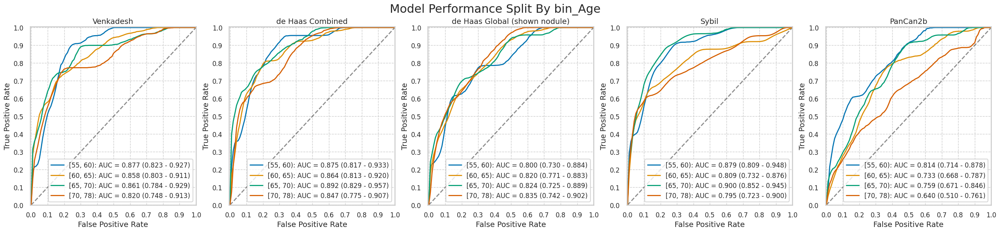

,num,pct,num_mal,pct_mal
"[55, 60)",351,29.948805,23,6.552707
"[60, 65)",372,31.740614,49,13.172043
"[65, 70)",255,21.757679,28,10.980392
"[70, 78)",194,16.552901,27,13.917526


In [25]:
nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_by_category(nlst_preds, f'bin_Age')

label                                              height  \
            count      mean       std  min  25%  50%  75%  max  count   
bin_height                                                              
(48, 68]    590.0  0.096610  0.295677  0.0  0.0  0.0  0.0  1.0  590.0   
(68, 88]    582.0  0.120275  0.325563  0.0  0.0  0.0  0.0  1.0  582.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.957627  2.309624  59.0  63.0  65.0  67.0  68.0  
(68, 88]    71.348797  1.939797  69.0  70.0  71.0  72.0  78.0

,num,pct,num_mal,pct_mal
"(48, 68]",590,50.341297,57,9.661017
"(68, 88]",582,49.658703,70,12.027491


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",590,51,259,274,6,0.894737,0.485929,0.105263,0.514071,0.164516,0.978571,0.835484,0.021429,0.550847
"(68, 88]",582,66,231,281,4,0.942857,0.451172,0.057143,0.548828,0.222222,0.985965,0.777778,0.014035,0.596220


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",590,54,312,221,3,0.947368,0.585366,0.052632,0.414634,0.147541,0.986607,0.852459,0.013393,0.466102
"(68, 88]",582,68,267,245,2,0.971429,0.521484,0.028571,0.478516,0.202985,0.991903,0.797015,0.008097,0.537801


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",590,45,180,353,12,0.789474,0.337711,0.210526,0.662289,0.200000,0.967123,0.800000,0.032877,0.674576
"(68, 88]",582,53,160,352,17,0.757143,0.312500,0.242857,0.687500,0.248826,0.953930,0.751174,0.046070,0.695876


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",590,48,117,416,9,0.842105,0.219512,0.157895,0.780488,0.290909,0.978824,0.709091,0.021176,0.786441
"(68, 88]",582,50,122,390,20,0.714286,0.238281,0.285714,0.761719,0.290698,0.951220,0.709302,0.048780,0.756014


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",590,50,348,185,7,0.877193,0.652908,0.122807,0.347092,0.125628,0.963542,0.874372,0.036458,0.398305
"(68, 88]",582,63,285,227,7,0.900000,0.556641,0.100000,0.443359,0.181034,0.970085,0.818966,0.029915,0.498282


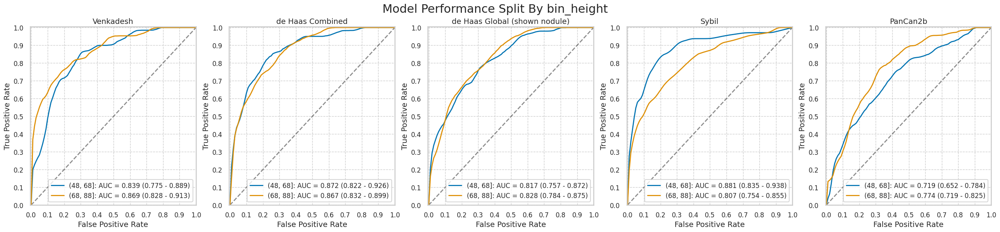

,num,pct,num_mal,pct_mal
"(48, 68]",590,50.341297,57,9.661017
"(68, 88]",582,49.658703,70,12.027491


In [26]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_by_category(nlst_preds, f'bin_height')

label                                              weight  \
            count      mean       std  min  25%  50%  75%  max  count   
bin_weight                                                              
(79, 179]   565.0  0.107965  0.310611  0.0  0.0  0.0  0.0  1.0  565.0   
(179, 279]  588.0  0.108844  0.311708  0.0  0.0  0.0  0.0  1.0  588.0   

                                                                      
                  mean        std    min    25%    50%    75%    max  
bin_weight                                                            
(79, 179]   150.851327  20.469988   90.0  139.0  155.0  168.0  178.0  
(179, 279]  210.079932  24.316386  180.0  190.0  204.0  225.0  275.0

,num,pct,num_mal,pct_mal
"(79, 179]",565,49.002602,61,10.796460
"(179, 279]",588,50.997398,64,10.884354


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",565,58,254,250,3,0.95082,0.503968,0.04918,0.496032,0.185897,0.988142,0.814103,0.011858,0.545133
"(179, 279]",588,58,227,297,6,0.90625,0.433206,0.09375,0.566794,0.203509,0.980198,0.796491,0.019802,0.603741


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",565,60,298,206,1,0.983607,0.591270,0.016393,0.408730,0.167598,0.995169,0.832402,0.004831,0.470796
"(179, 279]",588,60,275,249,4,0.937500,0.524809,0.062500,0.475191,0.179104,0.984190,0.820896,0.015810,0.525510


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",565,52,186,318,9,0.852459,0.369048,0.147541,0.630952,0.218487,0.972477,0.781513,0.027523,0.654867
"(179, 279]",588,44,151,373,20,0.687500,0.288168,0.312500,0.711832,0.225641,0.949109,0.774359,0.050891,0.709184


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",565,51,111,393,10,0.836066,0.220238,0.163934,0.779762,0.314815,0.975186,0.685185,0.024814,0.785841
"(179, 279]",588,46,123,401,18,0.718750,0.234733,0.281250,0.765267,0.272189,0.957041,0.727811,0.042959,0.760204


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",565,55,339,165,6,0.901639,0.672619,0.098361,0.327381,0.139594,0.964912,0.860406,0.035088,0.389381
"(179, 279]",588,56,283,241,8,0.875000,0.540076,0.125000,0.459924,0.165192,0.967871,0.834808,0.032129,0.505102


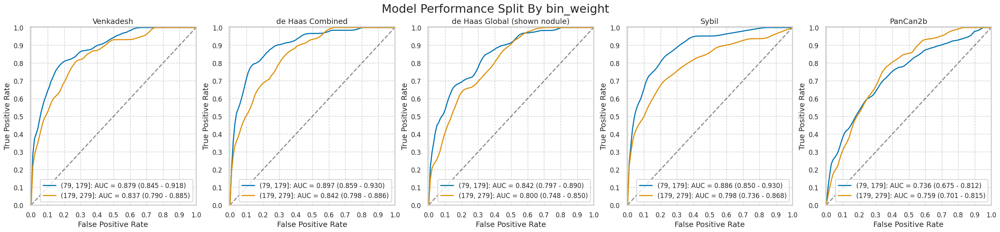

,num,pct,num_mal,pct_mal
"(79, 179]",565,49.002602,61,10.796460
"(179, 279]",588,50.997398,64,10.884354


In [27]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

pkyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,56.656603,22.031699,30.0,40.00,50.0,67.50,162.0
1,127.0,70.186220,29.608258,30.0,49.75,64.5,84.75,224.0


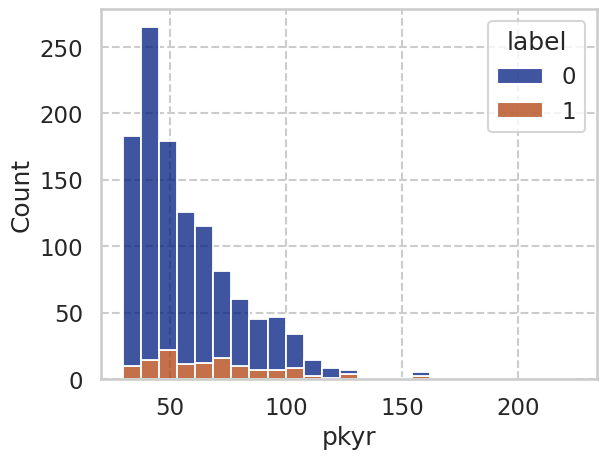

smokeage


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,16.448804,3.476042,5.0,14.0,16.0,18.0,40.0
1,127.0,16.220472,3.231574,8.0,14.0,16.0,18.0,26.0


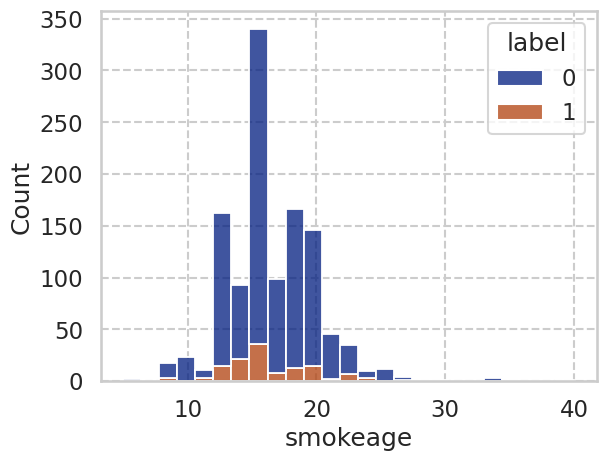

smokeday


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,28.328230,11.434740,12.0,20.0,25.0,32.0,80.0
1,127.0,31.818898,12.065573,18.0,20.0,30.0,40.0,80.0


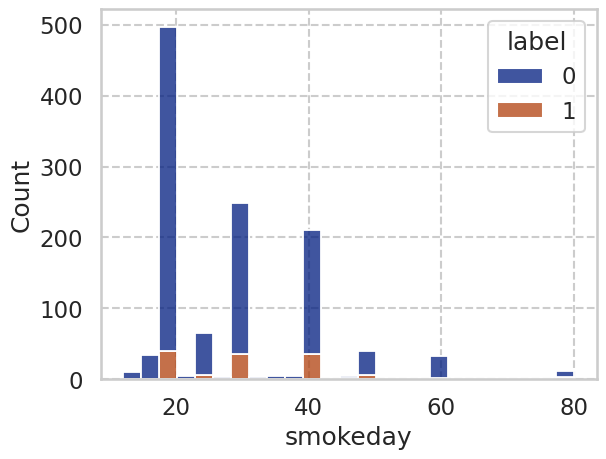

smokeyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,40.886124,7.696808,17.0,36.0,41.0,46.0,61.0
1,127.0,44.086614,7.219928,29.0,39.0,44.0,49.0,65.0


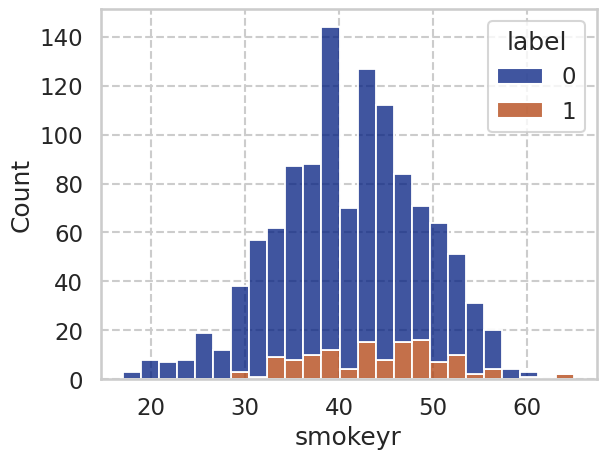

In [28]:
for c in nlst_democols['num']['smoke']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                                pkyr  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_pkyr                                                                    
(29.999, 52.0]  601.0  0.063228  0.243575  0.0  0.0  0.0  0.0  1.0  601.0   
(52.0, 224.0]   571.0  0.155867  0.363047  0.0  0.0  0.0  0.0  1.0  571.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_pkyr                                                             
(29.999, 52.0]  40.953411   6.072504  30.0  36.0  41.0  46.0   52.0  
(52.0, 224.0]   76.194046  21.033603  52.5  60.0  70.0  88.0  224.0

,num,pct,num_mal,pct_mal
"(29.999, 52.0]",601,51.279863,38,6.322795
"(52.0, 224.0]",571,48.720137,89,15.586690


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 52.0]",601,32,247,316,6,0.842105,0.438721,0.157895,0.561279,0.114695,0.981366,0.885305,0.018634,0.579035
"(52.0, 224.0]",571,85,243,239,4,0.955056,0.504149,0.044944,0.495851,0.259146,0.983539,0.740854,0.016461,0.567426


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 52.0]",601,36,320,243,2,0.947368,0.568384,0.052632,0.431616,0.101124,0.991837,0.898876,0.008163,0.464226
"(52.0, 224.0]",571,86,259,223,3,0.966292,0.537344,0.033708,0.462656,0.249275,0.986726,0.750725,0.013274,0.541156


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 52.0]",601,30,172,391,8,0.789474,0.305506,0.210526,0.694494,0.148515,0.979950,0.851485,0.020050,0.700499
"(52.0, 224.0]",571,68,168,314,21,0.764045,0.348548,0.235955,0.651452,0.288136,0.937313,0.711864,0.062687,0.669002


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 52.0]",601,28,126,437,10,0.736842,0.223801,0.263158,0.776199,0.181818,0.977629,0.818182,0.022371,0.773710
"(52.0, 224.0]",571,70,113,369,19,0.786517,0.234440,0.213483,0.765560,0.382514,0.951031,0.617486,0.048969,0.768827


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 52.0]",601,35,334,229,3,0.921053,0.593250,0.078947,0.406750,0.094851,0.987069,0.905149,0.012931,0.439268
"(52.0, 224.0]",571,78,299,183,11,0.876404,0.620332,0.123596,0.379668,0.206897,0.943299,0.793103,0.056701,0.457093


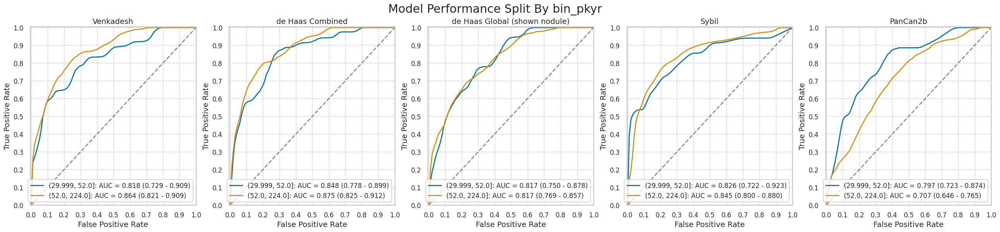

label                                              smokeage  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                 
(4.999, 16.0]  648.0  0.120370  0.325646  0.0  0.0  0.0  0.0  1.0    648.0   
(16.0, 40.0]   524.0  0.093511  0.291426  0.0  0.0  0.0  0.0  1.0    524.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.074074  1.907621   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.330153  2.615545  17.0  18.0  18.0  20.0  40.0

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",648,55.290102,78,12.037037
"(16.0, 40.0]",524,44.709898,49,9.351145


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",648,74,287,283,4,0.948718,0.503509,0.051282,0.496491,0.204986,0.986063,0.795014,0.013937,0.550926
"(16.0, 40.0]",524,43,203,272,6,0.877551,0.427368,0.122449,0.572632,0.174797,0.978417,0.825203,0.021583,0.601145


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",648,74,314,256,4,0.948718,0.550877,0.051282,0.449123,0.190722,0.984615,0.809278,0.015385,0.509259
"(16.0, 40.0]",524,48,265,210,1,0.979592,0.557895,0.020408,0.442105,0.153355,0.995261,0.846645,0.004739,0.492366


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",648,58,208,362,20,0.743590,0.364912,0.256410,0.635088,0.218045,0.947644,0.781955,0.052356,0.648148
"(16.0, 40.0]",524,40,132,343,9,0.816327,0.277895,0.183673,0.722105,0.232558,0.974432,0.767442,0.025568,0.730916


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",648,62,130,440,16,0.794872,0.228070,0.205128,0.771930,0.322917,0.964912,0.677083,0.035088,0.774691
"(16.0, 40.0]",524,36,109,366,13,0.734694,0.229474,0.265306,0.770526,0.248276,0.965699,0.751724,0.034301,0.767176


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",648,67,357,213,11,0.858974,0.626316,0.141026,0.373684,0.158019,0.950893,0.841981,0.049107,0.432099
"(16.0, 40.0]",524,46,276,199,3,0.938776,0.581053,0.061224,0.418947,0.142857,0.985149,0.857143,0.014851,0.467557


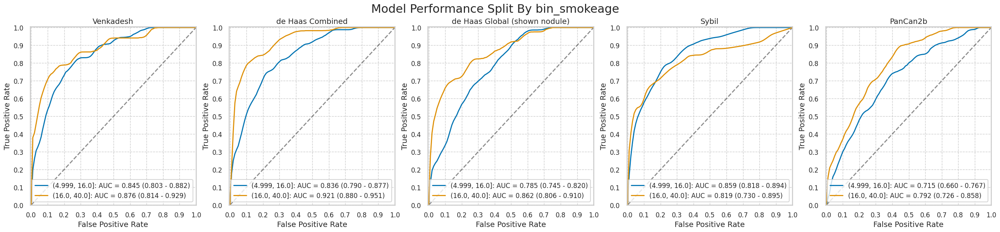

label                                              smokeday  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                  
(11.999, 25.0]  611.0  0.075286  0.264069  0.0  0.0  0.0  0.0  1.0    611.0   
(25.0, 80.0]    561.0  0.144385  0.351793  0.0  0.0  0.0  0.0  1.0    561.0   

                                                                    
                     mean        std   min   25%   50%   75%   max  
bin_smokeday                                                        
(11.999, 25.0]  20.081833   2.207256  12.0  20.0  20.0  20.0  25.0  
(25.0, 80.0]    38.099822  10.204027  28.0  30.0  40.0  40.0  80.0

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",611,52.133106,46,7.528642
"(25.0, 80.0]",561,47.866894,81,14.438503


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",611,39,260,305,7,0.847826,0.460177,0.152174,0.539823,0.130435,0.977564,0.869565,0.022436,0.563011
"(25.0, 80.0]",561,78,230,250,3,0.962963,0.479167,0.037037,0.520833,0.253247,0.988142,0.746753,0.011858,0.584670


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",611,44,331,234,2,0.956522,0.585841,0.043478,0.414159,0.117333,0.991525,0.882667,0.008475,0.454992
"(25.0, 80.0]",561,78,248,232,3,0.962963,0.516667,0.037037,0.483333,0.239264,0.987234,0.760736,0.012766,0.552585


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",611,34,174,391,12,0.739130,0.307965,0.260870,0.692035,0.163462,0.970223,0.836538,0.029777,0.695581
"(25.0, 80.0]",561,64,166,314,17,0.790123,0.345833,0.209877,0.654167,0.278261,0.948640,0.721739,0.051360,0.673797


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",611,32,126,439,14,0.695652,0.223009,0.304348,0.776991,0.202532,0.969095,0.797468,0.030905,0.770867
"(25.0, 80.0]",561,66,113,367,15,0.814815,0.235417,0.185185,0.764583,0.368715,0.960733,0.631285,0.039267,0.771836


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",611,42,345,220,4,0.913043,0.610619,0.086957,0.389381,0.108527,0.982143,0.891473,0.017857,0.428805
"(25.0, 80.0]",561,71,288,192,10,0.876543,0.600000,0.123457,0.400000,0.197772,0.950495,0.802228,0.049505,0.468806


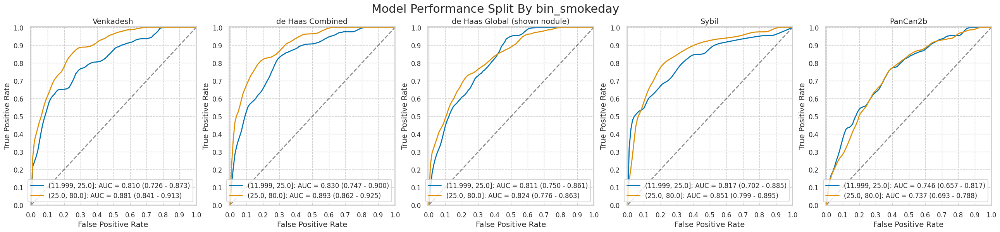

label                                              smokeyr  \
                count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                  
(16.999, 41.0]  603.0  0.077944  0.268305  0.0  0.0  0.0  0.0  1.0   603.0   
(41.0, 65.0]    569.0  0.140598  0.347912  0.0  0.0  0.0  0.0  1.0   569.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(16.999, 41.0]  35.368159  5.119546  17.0  32.0  37.0  40.0  41.0  
(41.0, 65.0]    47.448155  4.416024  42.0  44.0  46.0  50.0  65.0

,num,pct,num_mal,pct_mal
"(16.999, 41.0]",603,51.450512,47,7.794362
"(41.0, 65.0]",569,48.549488,80,14.059754


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",603,46,241,315,1,0.978723,0.433453,0.021277,0.566547,0.160279,0.996835,0.839721,0.003165,0.598673
"(41.0, 65.0]",569,71,249,240,9,0.887500,0.509202,0.112500,0.490798,0.221875,0.963855,0.778125,0.036145,0.546573


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",603,46,296,260,1,0.978723,0.532374,0.021277,0.467626,0.134503,0.996169,0.865497,0.003831,0.507463
"(41.0, 65.0]",569,76,283,206,4,0.950000,0.578732,0.050000,0.421268,0.211699,0.980952,0.788301,0.019048,0.495606


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",603,40,171,385,7,0.851064,0.307554,0.148936,0.692446,0.189573,0.982143,0.810427,0.017857,0.704809
"(41.0, 65.0]",569,58,169,320,22,0.725000,0.345603,0.275000,0.654397,0.255507,0.935673,0.744493,0.064327,0.664323


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",603,38,125,431,9,0.808511,0.224820,0.191489,0.775180,0.233129,0.979545,0.766871,0.020455,0.777778
"(41.0, 65.0]",569,60,114,375,20,0.750000,0.233129,0.250000,0.766871,0.344828,0.949367,0.655172,0.050633,0.764499


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",603,44,312,244,3,0.93617,0.561151,0.06383,0.438849,0.123596,0.987854,0.876404,0.012146,0.477612
"(41.0, 65.0]",569,69,321,168,11,0.86250,0.656442,0.13750,0.343558,0.176923,0.938547,0.823077,0.061453,0.416520


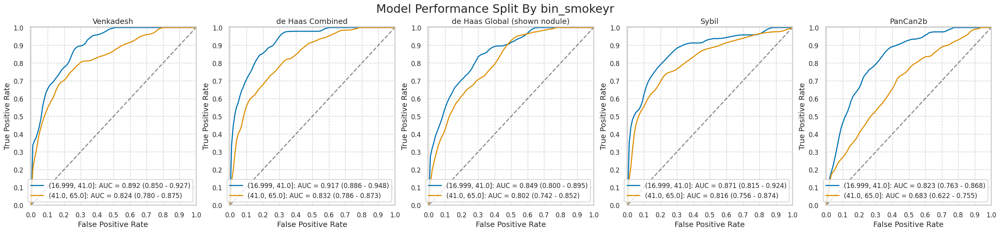

In [29]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

In [30]:
# included_num_cols = ["Diameter [mm]", "NoduleCounts"]
# for c in included_num_cols:
#     print(c)
#     display(nlst_preds.groupby('label')[c].describe())
#     sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
#     plt.show()

In [31]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')

## Further binning categorical columns

In [32]:
nlst_preds[['race', 'ethnic']].value_counts()

race  ethnic
1.0   2.0       1089
2.0   2.0         39
6.0   2.0         11
4.0   2.0         10
1.0   1.0          8
3.0   2.0          7
5.0   2.0          3
Name: count, dtype: int64

,num,pct,num_mal,pct_mal
False,83,7.081911,16,19.277108
True,1089,92.918089,111,10.192837


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,83,13,44,23,3,0.812500,0.656716,0.187500,0.343284,0.228070,0.884615,0.771930,0.115385,0.433735
True,1089,104,446,532,7,0.936937,0.456033,0.063063,0.543967,0.189091,0.987013,0.810909,0.012987,0.584022


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,83,16,45,22,0,1.000000,0.671642,0.000000,0.328358,0.262295,1.000000,0.737705,0.000000,0.457831
True,1089,106,534,444,5,0.954955,0.546012,0.045045,0.453988,0.165625,0.988864,0.834375,0.011136,0.505051


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,83,12,23,44,4,0.750000,0.343284,0.250000,0.656716,0.342857,0.916667,0.657143,0.083333,0.674699
True,1089,86,317,661,25,0.774775,0.324131,0.225225,0.675869,0.213400,0.963557,0.786600,0.036443,0.685950


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,83,10,21,46,6,0.625000,0.313433,0.375000,0.686567,0.322581,0.884615,0.677419,0.115385,0.674699
True,1089,88,218,760,23,0.792793,0.222904,0.207207,0.777096,0.287582,0.970626,0.712418,0.029374,0.778696


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,83,14,52,15,2,0.875000,0.776119,0.125000,0.223881,0.212121,0.882353,0.787879,0.117647,0.349398
True,1089,99,581,397,12,0.891892,0.594070,0.108108,0.405930,0.145588,0.970660,0.854412,0.029340,0.455464


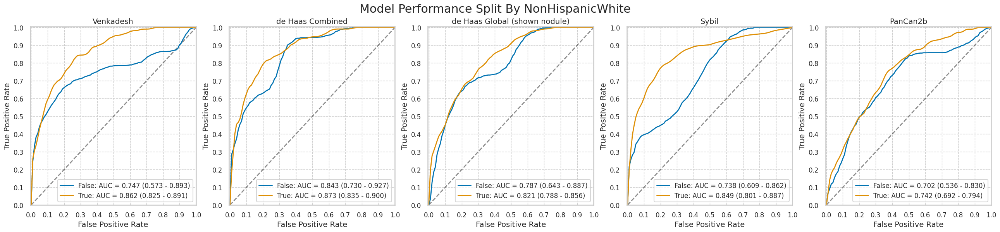

,num,pct,num_mal,pct_mal
False,83,7.081911,16,19.277108
True,1089,92.918089,111,10.192837


In [33]:
non_hispanic_white = (nlst_preds['race'] == 1.0) & (nlst_preds['ethnic'] == 2.0)
nlst_preds['NonHispanicWhite'] = non_hispanic_white
plot_by_category(nlst_preds, 'NonHispanicWhite')

In [34]:
high_school_plus = (nlst_preds['educat'] != 1.0)
nlst_preds['HighSchoolPlus'] = high_school_plus
plot_by_category(nlst_preds, 'HighSchoolPlus')

,num,pct,num_mal,pct_mal
False,27,2.303754,4,14.814815
True,1145,97.696246,123,10.742358


Not plotting ROC since there are zero values for malignant or benign nodules :(


,num,pct,num_mal,pct_mal
False,27,2.303754,4,14.814815
True,1145,97.696246,123,10.742358


,num,pct,num_mal,pct_mal
False,387,33.020478,41,10.594315
True,785,66.979522,86,10.955414


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,387,38,174,172,3,0.926829,0.502890,0.073171,0.497110,0.179245,0.982857,0.820755,0.017143,0.542636
True,785,79,316,383,7,0.918605,0.452074,0.081395,0.547926,0.200000,0.982051,0.800000,0.017949,0.588535


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,387,39,208,138,2,0.951220,0.601156,0.048780,0.398844,0.157895,0.985714,0.842105,0.014286,0.457364
True,785,83,371,328,3,0.965116,0.530758,0.034884,0.469242,0.182819,0.990937,0.817181,0.009063,0.523567


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,387,33,114,232,8,0.804878,0.329480,0.195122,0.670520,0.224490,0.966667,0.775510,0.033333,0.684755
True,785,65,226,473,21,0.755814,0.323319,0.244186,0.676681,0.223368,0.957490,0.776632,0.042510,0.685350


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,387,33,76,270,8,0.804878,0.219653,0.195122,0.780347,0.302752,0.971223,0.697248,0.028777,0.782946
True,785,65,163,536,21,0.755814,0.233190,0.244186,0.766810,0.285088,0.962298,0.714912,0.037702,0.765605


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,387,38,239,107,3,0.926829,0.690751,0.073171,0.309249,0.137184,0.972727,0.862816,0.027273,0.374677
True,785,75,394,305,11,0.872093,0.563662,0.127907,0.436338,0.159915,0.965190,0.840085,0.034810,0.484076


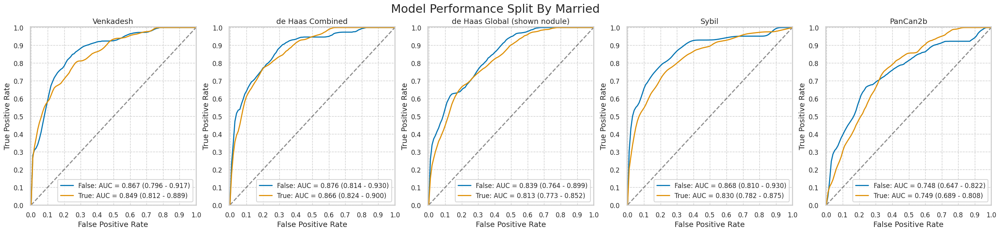

,num,pct,num_mal,pct_mal
False,387,33.020478,41,10.594315
True,785,66.979522,86,10.955414


In [35]:
married = (nlst_preds['marital'] == 2.0)
nlst_preds['Married'] = married
plot_by_category(nlst_preds, 'Married')